# Optical Gain Simulation plot

In [2]:
from hcipy import *
import numpy as np
import matplotlib.pyplot as plt
from importlib import reload
# These modules are used for animating some oåf the graphs in our notebook.
from matplotlib import animation, rc
from IPython.display import HTML

from hcipy import atmosphere
from hcipy import fourier
import matplotlib as mpl

%matplotlib inline

## Try 1: using the sparkle simulation code

In [4]:
import sim_sparkle as smsp
reload(smsp)

<module 'sim_sparkle' from '/home/eden/code/sparkles/sim/sim_sparkle.py'>

### part 1: setting up the AO and zernike system

In [5]:
# creating the grids across which the pupils etc are defined
pupil_grid, pwfs_grid, magellan_aperture = smsp.create_mag_pupil()
# creating a modulated pywfs
mpwfs, camera = smsp.create_mod_PWFS(pupil_grid, pwfs_grid, n_steps=10)

In [6]:
# wavefront generation 
#NEW CODE : supersample evaluation
wf = smsp.create_wf(magellan_aperture)
wfs_pywfs = smsp.create_pwfs(mpwfs, wf)
#creating an image refernce to use later
image_ref = smsp.mod_forward_int(wfs_pywfs)

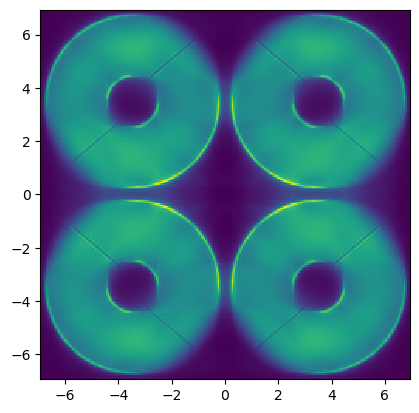

In [7]:
# displaying the reference image
imshow_field(image_ref)

In [1]:
# creating DM : Zernike modes
n_z_modes = 200
zern_dm = smsp.create_DM_zern(pupil_grid, n_z_modes, magellan_aperture)
#creating the slopes
zern_slopes = smsp.create_int_mat_mod(zern_dm, wf, mpwfs) #careful from surface to OPD translation
# from slopes, calculate a response matrix
zern_ret_mat = smsp.create_recon_mat(zern_slopes)

NameError: name 'smsp' is not defined

In [ ]:
reload(smsp)
zern_ret_mat = smsp.create_recon_mat(zern_slopes)

### parta 1.5 trying KL Basis

Maybe use KL modes and avoid this problem => ACTUALLY actuator pokes, these are silly, mabe use fourier basis

In [8]:
# creating DM : KL modes (actually gaussian modes)
kl_dm = smsp.create_DM(pupil_grid)
kl_slopes = smsp.create_int_mat_mod(kl_dm, wf, mpwfs)
kl_mat = smsp.create_recon_mat(kl_slopes)

Measure response to mode 1 / 2500
Measure response to mode 11 / 2500
Measure response to mode 21 / 2500
Measure response to mode 31 / 2500


Measure response to mode 41 / 2500
Measure response to mode 51 / 2500
Measure response to mode 61 / 2500
Measure response to mode 71 / 2500
Measure response to mode 81 / 2500
Measure response to mode 91 / 2500
Measure response to mode 101 / 2500
Measure response to mode 111 / 2500
Measure response to mode 121 / 2500
Measure response to mode 131 / 2500
Measure response to mode 141 / 2500
Measure response to mode 151 / 2500
Measure response to mode 161 / 2500
Measure response to mode 171 / 2500
Measure response to mode 181 / 2500
Measure response to mode 191 / 2500
Measure response to mode 201 / 2500
Measure response to mode 211 / 2500
Measure response to mode 221 / 2500
Measure response to mode 231 / 2500
Measure response to mode 241 / 2500
Measure response to mode 251 / 2500
Measure response to mode 261 / 2500
Measure response to mode 271 / 2500
Measure response to mode 281 / 2500
Measure response to mode 291 / 2500
Measure response to mode 301 / 2500
Measure response to mode 311 / 250

In [ ]:
# mode iterations
mode_index = np.array([0, 40, 180])
amplitudes = np.linspace(0, 750e-9, 51)

In [11]:
# ITER ON KLs - NON RESIDUALS
# Non residual iterations
wf = smsp.create_wf(magellan_aperture)
kl_rec_coeff = np.zeros((mode_index.size, amplitudes.size)) #coeffs without additional aberrations
for mi, mode in enumerate(mode_index):
    print(f"MODE: {mode}")
    for ai, amp in enumerate(amplitudes):
        # DM KL
        kl_dm.flatten()
        kl_dm.actuators[mode] = amp # rms put in get twice back
        # propagate through the AO system
        wf_kl = kl_dm.forward(wf)
        phase = wf_kl.phase
        wf_pyr = mpwfs.forward(wf_kl)
        wfs_image = smsp.mod_forward_int(wf_pyr)
        diff_image = wfs_image - image_ref
        # Use Coeffs on the reconstruction to see differences
        coeffs = kl_mat.dot(diff_image) 
        # adding to the 
        kl_rec_coeff[mi, ai] = coeffs[mode]

MODE: 0
MODE: 40
MODE: 180


### part 1.5b trying Fourier Basis

In [7]:
# Making a fourier mode DM
fourier_grid = make_pupil_grid(smsp.num_actuators_across_pupil, 2*np.pi*smsp.num_actuators_across_pupil/smsp.telescope_diameter)
fourier_grid = fourier_grid.rotate(0.6)  #number in radians) # rotating? 
fourier_influence_funcs = make_fourier_basis(pupil_grid, fourier_grid)
fourier_dm = smsp.create_DM_fourier(pupil_grid)

In [8]:
fm_slopes = smsp.create_int_mat_mod(fourier_deformable_mirror, wf, mpwfs)


Measure response to mode 1 / 2500


Measure response to mode 11 / 2500
Measure response to mode 21 / 2500
Measure response to mode 31 / 2500
Measure response to mode 41 / 2500
Measure response to mode 51 / 2500
Measure response to mode 61 / 2500
Measure response to mode 71 / 2500
Measure response to mode 81 / 2500
Measure response to mode 91 / 2500
Measure response to mode 101 / 2500
Measure response to mode 111 / 2500
Measure response to mode 121 / 2500
Measure response to mode 131 / 2500
Measure response to mode 141 / 2500
Measure response to mode 151 / 2500
Measure response to mode 161 / 2500
Measure response to mode 171 / 2500
Measure response to mode 181 / 2500
Measure response to mode 191 / 2500
Measure response to mode 201 / 2500
Measure response to mode 211 / 2500
Measure response to mode 221 / 2500
Measure response to mode 231 / 2500
Measure response to mode 241 / 2500
Measure response to mode 251 / 2500
Measure response to mode 261 / 2500
Measure response to mode 271 / 2500
Measure response to mode 281 / 2500
M

In [ ]:
reload(smsp)
fm_mat = smsp.create_recon_mat(fm_slopes)

In [9]:
fourier_dm = fourier_deformable_mirror

### TEST: Zernike vs. Fourier mode numbers

Plotting the pure mode reconstuction for the two different bases

In [10]:
# mode iterations
mode_index = np.array([0, 40, 180])
amplitudes = np.linspace(0, 750e-9, 51)

In [1]:
# ITER ON Zerns - NON RESIDUALS
# Non residual iterations
wf = smsp.create_wf(magellan_aperture)
fourier_rec_coeff = np.zeros((mode_index.size, amplitudes.size)) #coeffs without additional aberrations
for mi, mode in enumerate(mode_index):
    print(f"MODE: {mode}")
    for ai, amp in enumerate(amplitudes):
        # DM ZERN
        fourier_dm.flatten()
        fourier_dm.actuators[mode] = amp # rms put in get twice back
        # propagate through the AO system
        wf_fourier = fourier_dm.forward(wf)
        phase = wf_fourier.phase
        wf_pyr = mpwfs.forward(wf_fourier)
        wfs_image = smsp.mod_forward_int(wf_pyr)
        diff_image = wfs_image - image_ref
        # Use Coeffs on the reconstruction to see differences
        coeffs = fm_mat.dot(diff_image) 
        # adding to the 
        fourier_rec_coeff[mi, ai] = coeffs[mode]

NameError: name 'smsp' is not defined

In [12]:
# ITER ON Zerns - NON RESIDUALS
# Non residual iterations
wf = smsp.create_wf(magellan_aperture)
zern_rec_coeff = np.zeros((mode_index.size, amplitudes.size)) #coeffs without additional aberrations
for mi, mode in enumerate(mode_index):
    print(f"MODE: {mode}")
    for ai, amp in enumerate(amplitudes):
        # DM ZERN
        zern_dm.flatten()
        zern_dm.actuators[mode] = amp # rms put in get twice back
        # propagate through the AO system
        wf_zern = zern_dm.forward(wf)
        phase = wf_zern.phase
        wf_pyr = mpwfs.forward(wf_zern)
        wfs_image = smsp.mod_forward_int(wf_pyr)
        diff_image = wfs_image - image_ref
        # Use Coeffs on the reconstruction to see differences
        coeffs = zern_ret_mat.dot(diff_image) 
        # adding to the 
        zern_rec_coeff[mi, ai] = coeffs[mode]

MODE: 0
MODE: 40
MODE: 180


In [15]:
fourier_rec_coeff

array([[ 0.00000000e+00,  5.91199703e-12,  2.34488114e-11,
         4.53454996e-11,  6.27705517e-11,  6.71061553e-11,
         5.17078086e-11,  1.33008474e-11, -4.72523114e-11,
        -1.24952715e-10, -2.11419665e-10, -2.96241272e-10,
        -3.68653522e-10, -4.19228710e-10, -4.41267263e-10,
        -4.31659645e-10, -3.91099589e-10, -3.23660878e-10,
        -2.35869664e-10, -1.35489183e-10, -3.02685420e-11,
         7.31115772e-11,  1.69728008e-10,  2.56663819e-10,
         3.32841165e-10,  3.98546961e-10,  4.54811919e-10,
         5.02814296e-10,  5.43450563e-10,  5.77156187e-10,
         6.03986627e-10,  6.23899685e-10,  6.37131276e-10,
         6.44537829e-10,  6.47792420e-10,  6.49363311e-10,
         6.52261474e-10,  6.59603440e-10,  6.74083231e-10,
         6.97471459e-10,  7.30256109e-10,  7.71509529e-10,
         8.19017537e-10,  8.69650519e-10,  9.19905666e-10,
         9.66514929e-10,  1.00700159e-09,  1.04008133e-09,
         1.06583732e-09,  1.08564536e-09,  1.10187415e-0

<function matplotlib.pyplot.show(close=None, block=None)>

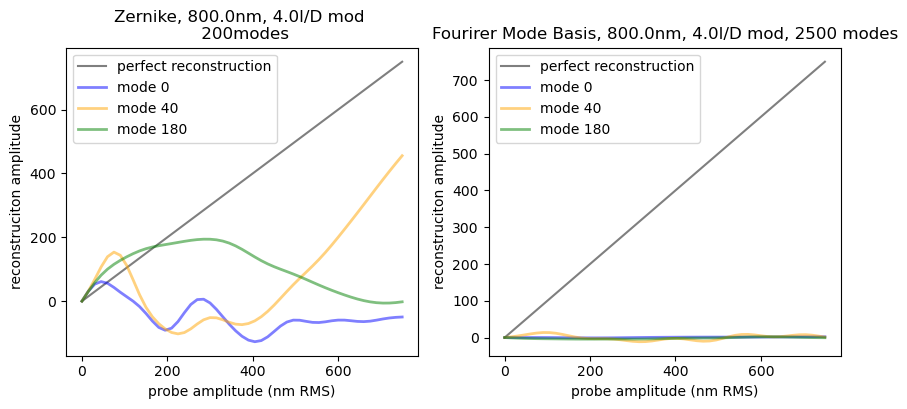

In [16]:
# side by side plots of the two different basis sets
colors = ['blue', 'orange', 'green']
fig = plt.figure(figsize=(10,4))

# plotting zernikes
plt.subplot(1,2,1)
plt.xlabel("probe amplitude (nm RMS)")
plt.ylabel("reconstruciton amplitude")
plt.title(f"Zernike, {np.round(smsp.wavelength_wfs/1e-9,3)}nm, {smsp.modulation/smsp.spatial_resolution}l/D mod \n 200modes")
plt.grid()
plt.plot(amplitudes/1e-9, amplitudes/1e-9, alpha=0.5, color = "black", label = "perfect reconstruction")
for e, mode in enumerate(mode_index):
    plt.plot(amplitudes/1e-9, 2*zern_rec_coeff[e,:]/1e-9, color = colors[e], lw=2, label = f'mode {mode}', alpha=0.5)
plt.grid()
plt.legend()

# plotting KL
plt.subplot(1,2,2)
plt.xlabel("probe amplitude (nm RMS)")
plt.ylabel("reconstruciton amplitude")
plt.title(f"Fourirer Mode Basis, {np.round(smsp.wavelength_wfs/1e-9,3)}nm, {smsp.modulation/smsp.spatial_resolution}l/D mod, 2500 modes")
plt.grid()
plt.plot(amplitudes/1e-9, amplitudes/1e-9, alpha=0.5, color = "black", label = "perfect reconstruction")
for e, mode in enumerate(mode_index):
    plt.plot(amplitudes/1e-9, 2*fourier_rec_coeff[e,:]/1e-9, color = colors[e], lw=2, label = f'mode {mode}', alpha=0.5)
plt.grid()
plt.legend()


plt.show

### TEST: do we get the pupil aberration right? (GIF)

In [8]:
# what I want to do: for each apmplitude of aberration, show what the reconstructor sees in the pupil plane
# test parameters:
num_steps = 51
amps_test = np.linspace(0, 750e-9, num_steps)
mode = 40 # only working on tip to start
coeff_test = np.zeros(amps_test.size) #coeffs without additional aberrations

#create the unaberrated wavefront
prop, norm, focal_grid = smsp.init_prop(pupil_grid, wf, n_airy=28)

wf = smsp.create_wf(magellan_aperture)
wf_zern = zern_dm.forward(wf)
PSF = prop(zern_dm(wf)).power

#going to animate this
def test_pupil_animation():
    # set up plotting
    fig = plt.figure(figsize=(16,3))
    # SENT ABERRATION
    plt.subplot(1,4,1)
    plt.title(r'Post DM wavefront (waves)')
    im1 = imshow_field(wf_zern.phase, pupil_grid)
    plt.colorbar()
    # RECONSTRUCTED ABERRATION
    plt.subplot(1,4,2)
    plt.title(r'Reonstructed surface ($\mathrm{\mu}$m)')
    im2 = imshow_field(zern_dm.surface/(1e-6), vmin=-1, vmax=1, cmap='bwr')
    plt.colorbar()
    #PSF response
    plt.subplot(1,4,3)
    plt.title('Science image plane')
    im3 = imshow_field(np.log10(PSF / norm), vmax=0, vmin=-5, cmap='inferno')
    plt.colorbar()
    # Reconstruction curve
    plt.subplot(1,4,4)
    plt.title('Reconstruction fidelity')
    line, = plt.plot(amps_test, coeff_test, color='k')
    #from the animationcode
    plt.close(fig)

    def animate(t): 
        ai = t
        amp = amps_test[t]
        # cear and set dm
        zern_dm.flatten()
        zern_dm.actuators[mode] = amp # rms put in get twice back SURFACE
        # propagate through the AO system
        wf_zern = zern_dm.forward(wf)
        phase = wf_zern.phase
        wf_pyr = mpwfs.forward(wf_zern)
        psf = prop(wf_zern).power
        # printing 
        #print(f"P2V: { np.max(phase) + np.abs(np.min(phase))}")
        #print("AMP: ", amp)
        # difference between what we have and what we expect
        wfs_image = smsp.mod_forward_int(wf_pyr)
        diff_image = wfs_image - image_ref
        
        # Use Coeffs on the reconstruction to see differences
        coeffs = zern_ret_mat.dot(diff_image)
        zern_dm.actuators = coeffs
        # adding to the 
        coeff_test[ai] = coeffs[mode]
        #SETTING PLOTs
        #print(wfs_image.shaped.shape)
        #print(zern_dm.surface.shaped.shape)
        #print(psf.shaped.shape)
        im1.set_data(*phase.grid.separated_coords, phase.shaped)
        im2.set_data(*pupil_grid.separated_coords, (magellan_aperture * zern_dm.surface).shaped / 1e-6)
        im3.set_data(*focal_grid.separated_coords, np.log10(psf.shaped / norm))
        line.set_data(amps_test[:ai], coeff_test[:ai])
        line.axes.axis([0, 8e-7, 0, 8e-7])

        return [im1, im2, im3, line]
    
    time_steps = np.arange(num_steps)
    anim = animation.FuncAnimation(fig, animate, time_steps, interval=160, blit=True)
    anim.save('test.gif')
    return HTML(anim.to_jshtml(default_mode='loop'))

test_pupil_animation()


### Test 2: Iterating over number of modes in the zernike basis

In [52]:
basis_number = np.array([50, 100, 200, 400])
mode_index = np.array([0, 40])
amplitudes = np.linspace(0, 750e-9, 51)
num_iterations = 10

In [53]:
# same modes, multiple DMs
wf = smsp.create_wf(magellan_aperture)
coeffs_basis = np.zeros((basis_number.size, mode_index.size, amplitudes.size)) #coeffs without additional aberrations
for nzi, nz_md in enumerate(basis_number):
    zern_dm_test = smsp.create_DM_zern(pupil_grid, nz_md, magellan_aperture)
    #creating the slopes
    zern_slopes_test = smsp.create_int_mat_mod(zern_dm_test, wf, mpwfs) #careful from surface to OPD translation
    # from slopes, calculate a response matrix
    zern_ret_mat_test = smsp.create_recon_mat(zern_slopes_test)
    for mi, mode in enumerate(mode_index):
        print(f"MODE: {mode}")
        for ai, amp in enumerate(amplitudes):
            zern_dm_test.flatten()
            zern_dm_test.actuators[mode] = amp # rms put in get twice back
            # propagate through the AO system
            wf_zern = zern_dm_test.forward(wf)
            phase = wf_zern.phase
            wf_pyr = mpwfs.forward(wf_zern)
            # difference between what we have and what we expect
            wfs_image = smsp.mod_forward_int(wf_pyr)
            diff_image = wfs_image - image_ref
            # Use Coeffs on the reconstruction to see differences
            coeffs = zern_ret_mat_test.dot(diff_image) 
            # adding to the 
            coeffs_basis[nzi, mi, ai] = coeffs[mode]

Measure response to mode 1 / 50
Measure response to mode 11 / 50
Measure response to mode 21 / 50
Measure response to mode 31 / 50
Measure response to mode 41 / 50
MODE: 0
MODE: 40
Measure response to mode 1 / 100
Measure response to mode 11 / 100
Measure response to mode 21 / 100
Measure response to mode 31 / 100
Measure response to mode 41 / 100
Measure response to mode 51 / 100
Measure response to mode 61 / 100
Measure response to mode 71 / 100
Measure response to mode 81 / 100
Measure response to mode 91 / 100
MODE: 0
MODE: 40
Measure response to mode 1 / 200
Measure response to mode 11 / 200
Measure response to mode 21 / 200
Measure response to mode 31 / 200
Measure response to mode 41 / 200
Measure response to mode 51 / 200
Measure response to mode 61 / 200
Measure response to mode 71 / 200
Measure response to mode 81 / 200
Measure response to mode 91 / 200
Measure response to mode 101 / 200
Measure response to mode 111 / 200
Measure response to mode 121 / 200
Measure response to

/tmp/ipykernel_242375/3155714524.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,2,e+1)


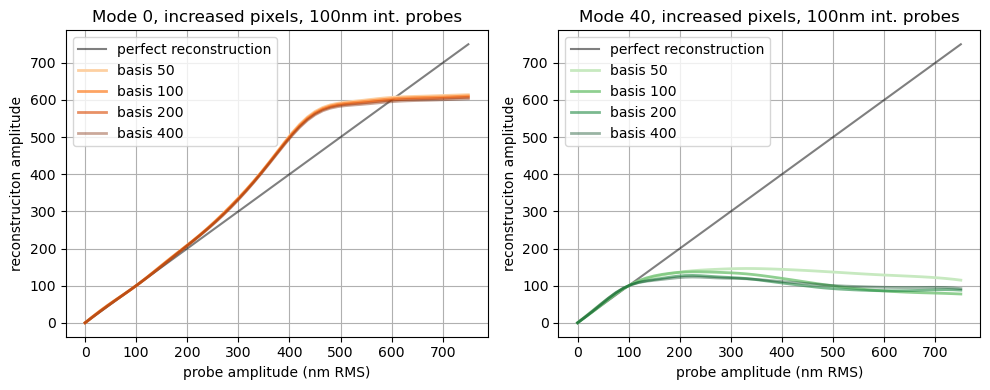

In [56]:
# plotting multi-basis sets
copper = mpl.colormaps['Oranges'].resampled(5)
viridis = mpl.colormaps['Greens'].resampled(5)
colors = np.array([copper(range(5)), viridis(range(5))])

fig = plt.figure(figsize=(10,4))
plt.grid()
for e, mode in enumerate(mode_index):
    plt.subplot(1,2,e+1)
    plt.xlabel("probe amplitude (nm RMS)")
    plt.ylabel("reconstruciton amplitude")
    plt.title(f"Mode {mode}, increased pixels, 100nm int. probes")
    plt.plot(amplitudes/1e-9, amplitudes/1e-9, alpha=0.5, color = "black", label = "perfect reconstruction")
    for z, basis in enumerate(basis_number):
        plt.plot(amplitudes/1e-9, coeffs_basis[z,e,:]/1e-9, color = colors[e,z+1], lw=2, label = f'basis {basis}', alpha=1 - 1/5*z)   
    plt.legend()
    plt.grid()
plt.tight_layout()
plt.show()
#plt.ylim([0,4e-7])

### TEST: dumb zernike reconstruction
I stg this is an infuriating system

In [6]:
reload(smsp)

<module 'sim_sparkle' from '/home/eden/code/sparkles/sim/sim_sparkle.py'>

In [7]:
# NO MORE INTERACTION MATRICES >:(
def dumb_zernikes(zern_slopes, wfs_image, mode):
    zern_coeff_dumb = np.sum(zern_slopes[mode,:]*wfs_image)
    return zern_coeff_dumb

In [8]:
n_z_modes = 50
zern_dm_norm = smsp.create_DM_zern(pupil_grid, n_z_modes, magellan_aperture)

In [74]:
deformable_mirror = zern_dm_norm
probe_amp = 2e-9 #MAGAOX is in SURFACE #0.01 * wavelength_wfs
slopes = []
slopes_norm = []
slope_image = []
num_modes = deformable_mirror.num_actuators
#iterate over the modes
for ind in range(num_modes):
    slope = 0
    deformable_mirror.flatten()
    for s in [1, -1]:
        # setting the DM mirrors
        deformable_mirror.flatten() 
        deformable_mirror.actuators[ind] += s * probe_amp
        # forwarding the wfs through the dm
        dm_wf = deformable_mirror.forward(wf)
        # MODULATION: use the mod pywfs
        mwfs_wf = mpwfs.forward(dm_wf)
        # MODULATION: use the modulation forwarding
        image = smsp.mod_forward_int(mwfs_wf)
        slope_image.append(image)
        #show the differences in the slope
        slope += s * (image)/(2 * probe_amp)
        #deformable_mirror.actuators[ind] -= s * probe_amp
    slope_scaled = np.sqrt(probe_amp)*slope/np.sqrt(np.sum(slope*slope))# took off slope scaled
    slopes_norm.append(slope_scaled)
    slopes.append(slope)
slopes = np.array(slopes)
slopes_norm = np.array(slopes_norm)

In [75]:
# self dot product should equal the probe amp
dotprod = slopes_norm*slopes_norm
np.sum(dotprod, axis = 1)

array([2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09,
       2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09,
       2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09,
       2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09,
       2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09,
       2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09, 2.e-09,
       2.e-09, 2.e-09])

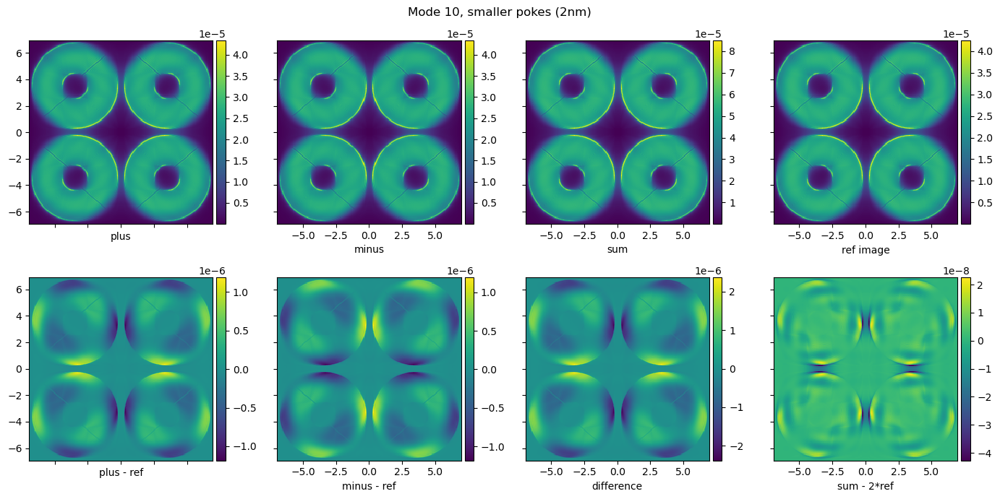

In [26]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
# this looks very wrong, should check all images
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(14,7), facecolor='white', sharey=True)
fig.suptitle("Mode 10, smaller pokes (2nm)")
fig.subplots_adjust(wspace=0)
plt.setp([a[0].get_xticklabels() for a in axs], visible=False)
# plus poke
plt.sca(axs[0,0])
plt.xlabel("plus")
im = imshow_field(slope_image[20])
divider = make_axes_locatable(axs[0,0])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical')
# plus poke - ref
ax = axs[1,0]
plt.sca(ax)
plt.xlabel("plus - ref")
im = imshow_field(slope_image[20] - image_ref)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical')
# minus poke
ax = axs[0,1]
plt.sca(ax)
plt.xlabel("minus")
im = imshow_field(slope_image[21])
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical')
# minus poke
ax = axs[1,1]
plt.sca(ax)
plt.xlabel("minus - ref")
im = imshow_field(slope_image[21]- image_ref)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical')
# sum
ax = axs[0,2]
plt.sca(ax)
plt.xlabel("sum")
im = imshow_field(slope_image[20] + slope_image[21])
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical')
# difference
ax = axs[1,2]
plt.sca(ax)
plt.xlabel("difference")
im = imshow_field(slope_image[20] - slope_image[21])
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical')
# ref
# difference
ax = axs[0,3]
plt.sca(ax)
plt.xlabel("ref image")
im = imshow_field(image_ref)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical')
# sum - ref
ax = axs[1,3]
plt.sca(ax)
plt.xlabel("sum - 2*ref")
im = imshow_field(slope_image[20] + slope_image[21] - 2*image_ref)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical')
#
plt.tight_layout()

In [70]:
# multiply mode by itself, do we get poke amplutude
amp_list = np.array([0.1e-9, 1e-9, 10e-9, 100e-9])
response = np.zeros((amp_list.size, n_z_modes))

wf = smsp.create_wf(magellan_aperture)

for a, amp in enumerate(amp_list):
    for m in range(n_z_modes):
        deformable_mirror.flatten()
        zern_dm_norm.actuators[m] = amp /2  # rms put in get twice back
        # propagate through the AO system
        wf_zern = zern_dm_norm.forward(wf)
        phase = wf_zern.phase
        wf_pyr = mpwfs.forward(wf_zern)
        # difference between what we have and what we expect
        wfs_image = smsp.mod_forward_int(wf_pyr)
        diff_image = wfs_image - image_ref
        # Use Coeffs on the reconstruction to see differences
        #coeffs = zern_ret_mat_test.dot(diff_image)
        coeff_d = dumb_zernikes(slopes_norm, diff_image, m)
        response[a, m] = coeff_d

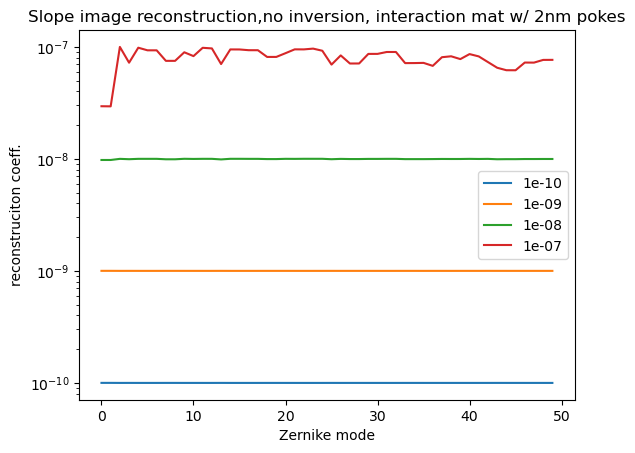

In [25]:
plt.title("Slope image reconstruction,no inversion, interaction mat w/ 2nm pokes")
plt.xlabel("Zernike mode")
plt.ylabel("reconstruciton coeff.")
for a, amp in enumerate(amp_list):
    plt.plot(range(n_z_modes), response[a,:]/(2e-9), label = amp)
plt.legend()
plt.yscale('log')
plt.show()

In [1]:
# creting an interaction matrix for comparison
zern_slopes_gen = smsp.create_int_mat_mod_normed(zern_dm_norm, wf, mpwfs) #careful from surface to OPD translation
zern_ret_mat = smsp.create_recon_mat(zern_slopes_gen)

NameError: name 'smsp' is not defined

In [71]:
# ITER ON ZERNIKES - NON RESIDUALS - DUMBBB
# mode iterations
mode_index = np.array([0, 10, 40])
amplitudes = np.linspace(0, 750e-9, 51)
num_iterations = 10
# Non residual iterations
wf = smsp.create_wf(magellan_aperture)
coeffs = np.zeros((mode_index.size, amplitudes.size)) #coeffs without additional aberrations
coeffs_dumb = np.zeros((mode_index.size, amplitudes.size)) #coeffs without additional aberrations
# iterating in detail over amplitudes to see behavior
for mi, mode in enumerate(mode_index):
    print(f"MODE: {mode}")
    for ai, amp in enumerate(amplitudes):
        zern_dm_norm.flatten()
        zern_dm_norm.actuators[mode] = amp # rms put in get twice back
        # propagate through the AO system
        wf_zern = zern_dm_norm.forward(wf)
        phase = wf_zern.phase
        wf_pyr = mpwfs.forward(wf_zern)
        # difference between what we have and what we expect
        wfs_image = smsp.mod_forward_int(wf_pyr)
        diff_image = wfs_image - image_ref
        # Use Coeffs on the reconstruction to see differences
        cf = zern_ret_mat.dot(diff_image) 
        cf_dumb = dumb_zernikes(slopes_norm, diff_image, m)
        # adding to the 
        coeffs[mi, ai] = cf[mode]
        coeffs_dumb[mi, ai] = cf_dumb

MODE: 0
MODE: 10
MODE: 40


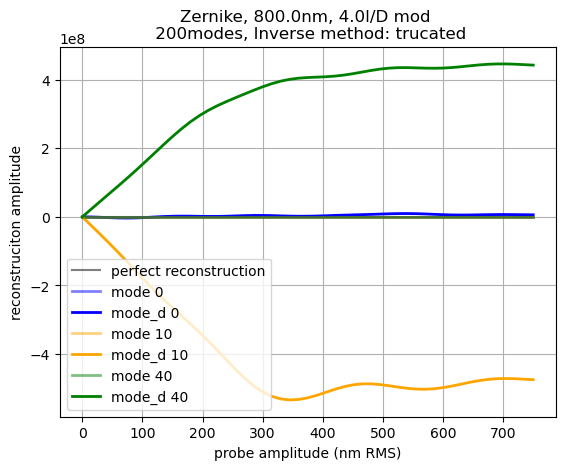

In [72]:
# plotting the difference from previous reconstructed matrix to ours
colors = ['blue', 'orange', 'green']
plt.plot(amplitudes/1e-9, amplitudes/1e-9, alpha=0.5, color = "black", label = "perfect reconstruction")

for e, mode in enumerate(mode_index):
    plt.plot(amplitudes/1e-9, coeffs[e,:]*1e-9, color = colors[e], lw=2, label = f'mode {mode}', alpha=0.5)
    plt.plot(amplitudes/1e-9, coeffs_dumb[e,:]/(1e-9 * 2e-9), color = colors[e], lw=2, label = f'mode_d {mode}', alpha=1)

#plt.ylim([0,4e-7])
plt.xlabel("probe amplitude (nm RMS)")
plt.ylabel("reconstruciton amplitude")
plt.title(f"Zernike, {np.round(smsp.wavelength_wfs/1e-9,3)}nm, {smsp.modulation/smsp.spatial_resolution}l/D mod \n 200modes, Inverse method: trucated")
plt.grid()
plt.legend()

In [23]:
coeff_d

Field(7.12719342e-09)

In [97]:
np.sum(diff_image*diff_image)

Field(2.35024248e-08)

In [70]:
# same modes, multiple DMs
wf = smsp.create_wf(magellan_aperture)
coeffs_basis = np.zeros((basis_number.size, mode_index.size, amplitudes.size)) #coeffs without additional aberrations
coeffs_dumb = np.zeros((basis_number.size, mode_index.size, amplitudes.size))
for nzi, nz_md in enumerate(basis_number):
    zern_dm_test = smsp.create_DM_zern(pupil_grid, nz_md, magellan_aperture)
    #creating the slopes
    zern_slopes_test = smsp.create_int_mat_mod(zern_dm_test, wf, mpwfs) #careful from surface to OPD translation
    # from slopes, calculate a response matrix
    zern_ret_mat_test = smsp.create_recon_mat(zern_slopes_test)
    for mi, mode in enumerate(mode_index):
        print(f"MODE: {mode}")
        for ai, amp in enumerate(amplitudes):
            zern_dm_test.flatten()
            zern_dm_test.actuators[mode] = amp # rms put in get twice back
            # propagate through the AO system
            wf_zern = zern_dm_test.forward(wf)
            phase = wf_zern.phase
            wf_pyr = mpwfs.forward(wf_zern)
            # difference between what we have and what we expect
            wfs_image = smsp.mod_forward_int(wf_pyr)
            diff_image = wfs_image - image_ref
            # Use Coeffs on the reconstruction to see differences
            coeffs = zern_ret_mat_test.dot(diff_image)
            coeff_d = dumb_zernikes(zern_slopes_test, diff_image, mode)
            # adding to the 
            coeffs_basis[nzi, mi, ai] = coeffs[mode]
            coeffs_dumb[nzi, mi, ai] = coeff_d

Measure response to mode 1 / 50
Measure response to mode 11 / 50
Measure response to mode 21 / 50
Measure response to mode 31 / 50
Measure response to mode 41 / 50
MODE: 0
MODE: 40
Measure response to mode 1 / 100
Measure response to mode 11 / 100
Measure response to mode 21 / 100
Measure response to mode 31 / 100
Measure response to mode 41 / 100
Measure response to mode 51 / 100
Measure response to mode 61 / 100
Measure response to mode 71 / 100
Measure response to mode 81 / 100
Measure response to mode 91 / 100
MODE: 0
MODE: 40
Measure response to mode 1 / 200
Measure response to mode 11 / 200
Measure response to mode 21 / 200
Measure response to mode 31 / 200
Measure response to mode 41 / 200
Measure response to mode 51 / 200
Measure response to mode 61 / 200
Measure response to mode 71 / 200
Measure response to mode 81 / 200
Measure response to mode 91 / 200
Measure response to mode 101 / 200
Measure response to mode 111 / 200
Measure response to mode 121 / 200
Measure response to

/tmp/ipykernel_242375/3328418792.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,2,e+1)


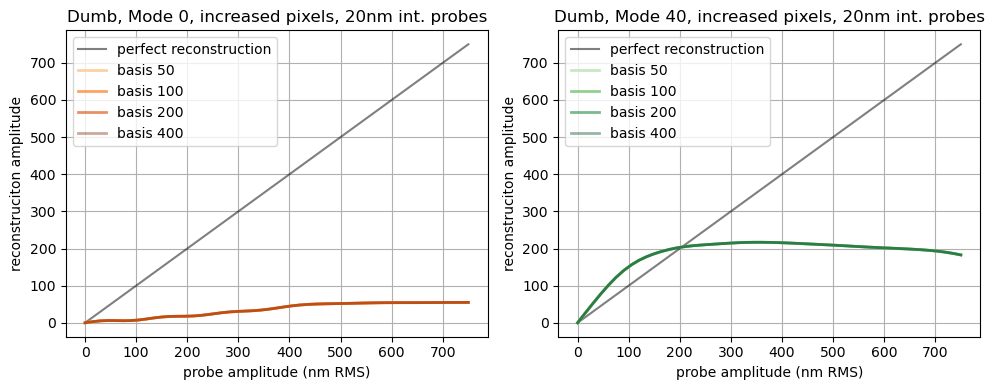

In [89]:
# plotting multi-basis sets
copper = mpl.colormaps['Oranges'].resampled(5)
viridis = mpl.colormaps['Greens'].resampled(5)
colors = np.array([copper(range(5)), viridis(range(5))])

fig = plt.figure(figsize=(10,4))
plt.grid()
for e, mode in enumerate(mode_index):
    plt.subplot(1,2,e+1)
    plt.xlabel("probe amplitude (nm RMS)")
    plt.ylabel("reconstruciton amplitude")
    plt.title(f"Dumb, Mode {mode}, increased pixels, 20nm int. probes")
    plt.plot(amplitudes/1e-9, amplitudes/1e-9, alpha=0.5, color = "black", label = "perfect reconstruction")
    for z, basis in enumerate(basis_number):
        plt.plot(amplitudes/1e-9, coeffs_dumb[z,e,:], color = colors[e,z+1], lw=2, label = f'basis {basis}', alpha=1 - 1/5*z) 
        #plt.plot(amplitudes/1e-9, coeffs_basis[z,e,:]/1e-9, color = colors[e,z+1], lw=2, label = f'basis {basis}', alpha=1 - 1/5*z)     
    plt.legend()
    plt.grid()
plt.tight_layout()
plt.show()
#plt.ylim([0,4e-7])

### part 2: iterating over modes

In [53]:
# mode iterations
mode_index = np.array([0, 40, 180])
amplitudes = np.linspace(0, 750e-9, 51)
num_iterations = 10

In [54]:
# ITER ON ZERNIKES - NON RESIDUALS
# mode iterations
mode_index = np.array([0, 40, 180])
amplitudes = np.linspace(0, 750e-9, 51)
num_iterations = 10
# Non residual iterations
wf = smsp.create_wf(magellan_aperture)
coefs = np.zeros((mode_index.size, amplitudes.size)) #coeffs without additional aberrations
for mi, mode in enumerate(mode_index):
    print(f"MODE: {mode}")
    for ai, amp in enumerate(amplitudes):
        zern_dm.flatten()
        zern_dm.actuators[mode] = amp # rms put in get twice back
        # propagate through the AO system
        wf_zern = zern_dm.forward(wf)
        phase = wf_zern.phase
        wf_pyr = mpwfs.forward(wf_zern)
        # printing 
        #print(f"P2V: { np.max(phase) + np.abs(np.min(phase))}")
        #print("AMP: ", amp)
        # difference between what we have and what we expect
        wfs_image = smsp.mod_forward_int(wf_pyr)
        diff_image = wfs_image - image_ref
        # Use Coeffs on the reconstruction to see differences
        coeffs = zern_ret_mat.dot(diff_image) 
        # adding to the 
        coefs[mi, ai] = coeffs[mode]

MODE: 0
MODE: 40
MODE: 180


In [35]:
# creating the surface aberrations to use later on 
ff = FourierFilter(pupil_grid, make_circular_aperture(2 * np.pi * 50 / smsp.telescope_diameter), q=4)

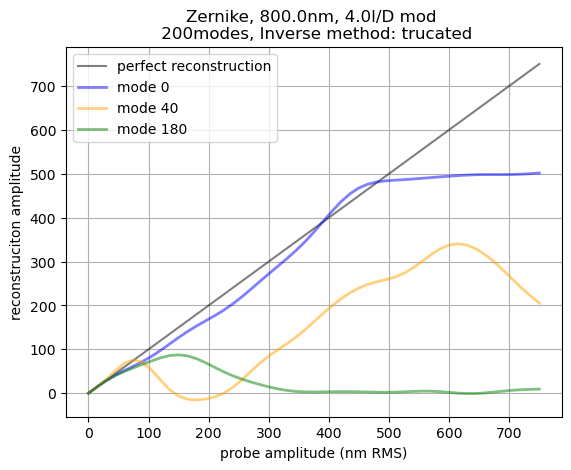

In [58]:
# plotting the returned modes

colors = ['blue', 'orange', 'green']
plt.plot(amplitudes/1e-9, amplitudes/1e-9, alpha=0.5, color = "black", label = "perfect reconstruction")

for e, mode in enumerate(mode_index):
    #mean = np.mean(coef_sa, axis=2)[e] / 1e-9
    #std = np.std(coef_sa, axis=2)[e] / 1e-9
    plt.plot(amplitudes/1e-9, coefs[e,:]/1e-9, color = colors[e], lw=2, label = f'mode {mode}', alpha=0.5)
    #plt.plot(amplitudes/1e-9, mean, color = colors[e], lw=2, linestyle='dashed', label = f'mode {mode} + res', alpha=0.5)

#plt.ylim([0,4e-7])
plt.xlabel("probe amplitude (nm RMS)")
plt.ylabel("reconstruciton amplitude")
plt.title(f"Zernike, {np.round(smsp.wavelength_wfs/1e-9,3)}nm, {smsp.modulation/smsp.spatial_resolution}l/D mod \n 200modes, Inverse method: trucated")
plt.grid()
plt.legend()

### **Testing:** hand calculating tip tilt

first test: showing we can split up the image to sum up pixels in that half

In [18]:
wf = smsp.create_wf(magellan_aperture)
zern_dm.flatten()
zern_dm.actuators[0] = 100e-9 /2
wf_zern = zern_dm.forward(wf)
wf_pyr = mpwfs.forward(wf_zern)
wfs_image = smsp.mod_forward_int(wf_pyr)

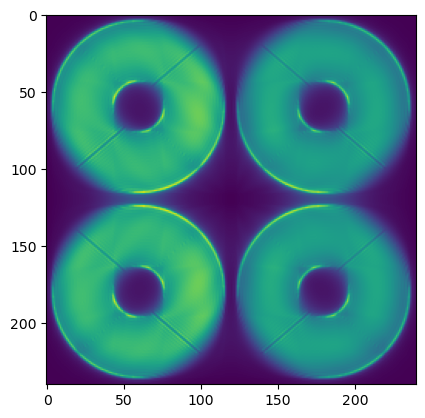

In [32]:
plt.imshow(wfs_image.shaped[:, :])

Next we're goign to go over the different mode basis sizes to see how this changes things.

In [31]:
basis_number = np.array([50, 100, 200, 400])
mode_index = np.array([0, 40])
amplitudes = np.linspace(0, 750e-9, 51)
num_iterations = 10

In [ ]:
def hand_calc_tip(wfs_image):
    # take the values from pwfs and sum on left and right
    left = np.sum(wfs_image.shaped[:, :120])
    right = np.sum(wfs_image.shaped[:, 120:])
    return (left - right) / (left + right) 

In [17]:
# ITER ON ZERNIKES - NON RESIDUALS
# Non residual iterations
wf = smsp.create_wf(magellan_aperture)
coefs = np.zeros((mode_index.size, amplitudes.size)) #coeffs without additional aberrations
sum_ratios = np.zeros((mode_index.size, amplitudes.size))

for ai, amp in enumerate(amplitudes):
    zern_dm.flatten()
    zern_dm.actuators[mode] = amp/2 # rms put in get twice back
    # propagate through the AO system
    wf_zern = zern_dm.forward(wf)
    phase = wf_zern.phase
    wf_pyr = mpwfs.forward(wf_zern)
    # printing 
    #print(f"P2V: { np.max(phase) + np.abs(np.min(phase))}")
    #print("AMP: ", amp)
    # difference between what we have and what we expect
    wfs_image = smsp.mod_forward_int(wf_pyr)
    diff_image = wfs_image - image_ref
    # Use Coeffs on the reconstruction to see differences
    coeffs = zern_ret_mat.dot(diff_image) 
    # adding to the 
    coefs[mi, ai] = coeffs[mode]

NameError: name 'mode_index' is not defined